In [1]:
import matplotlib.pyplot as plt
from pystac_client import Client
from pystac import ItemCollection
from odc.stac import stac_load
from pyproj import CRS
from xarray import Dataset, DataArray
from pyproj import Proj
import rioxarray
import geopandas as gpd
from shapely.geometry import shape
import json
from branca.element import Figure
import folium
import folium.plugins
import shapely.geometry
import yaml
from odc.algo import to_rgba
import odc.ui
from IPython.display import HTML, display
import xarray as xr

In [2]:
cfg = """---
sentinel-s2-l2a-cogs:
  assets:
    '*':
      data_type: uint16
      nodata: 0
      unit: '1'
    SCL:
      data_type: uint8
      nodata: 0
      unit: '1'
    visual:
      data_type: uint8
      nodata: 0
      unit: '1'
  aliases:  # Alias -> Canonical Name
    red: B04
    green: B03
    blue: B02
    nir: B08
    swir22: B12
"*":
  warnings: ignore # Disable warnings about duplicate common names
"""
cfg = yaml.load(cfg, Loader=yaml.SafeLoader)

In [3]:
km2deg = 1.0 / 111
# x, y = [-79.74, 39.5] - kingwood
x, y = [-85.00, 33.124] # - la grange
r = 100 * km2deg
bbox = (x - r, y - r, x + r, y + r)

In [4]:
# Query Search parameters
collection = ["sentinel-s2-l2a-cogs"]
date_range = "2023-02-01/2023-03-01"
bands = ["B02", "B03", "B04", "B08", "B12"]

search_kwargs = {
    "max_items": 15,
    "collections": collection,
    "datetime": date_range,
    "bbox": bbox
}

In [5]:
cat = Client.open("https://earth-search.aws.element84.com/v1")

In [9]:
query = cat.search(collections=["sentinel-2-l2a"], datetime="2023-06-01/2023-08-01", max_items=25, limit=15, bbox=bbox)

In [10]:
items = list(query.items())

In [11]:
items

[<Item id=S2A_16SFA_20230730_0_L2A>,
 <Item id=S2A_16SGA_20230730_0_L2A>,
 <Item id=S2A_17SKR_20230730_0_L2A>,
 <Item id=S2A_16SGB_20230730_0_L2A>,
 <Item id=S2A_17SKS_20230730_0_L2A>,
 <Item id=S2A_16SGC_20230730_0_L2A>,
 <Item id=S2A_17SKT_20230730_0_L2A>,
 <Item id=S2B_16SEA_20230728_0_L2A>,
 <Item id=S2B_16SFA_20230728_0_L2A>,
 <Item id=S2B_16SGA_20230728_0_L2A>,
 <Item id=S2B_17SKR_20230728_0_L2A>,
 <Item id=S2B_16SEB_20230728_0_L2A>,
 <Item id=S2B_16SFB_20230728_0_L2A>,
 <Item id=S2B_16SGB_20230728_0_L2A>,
 <Item id=S2B_17SKS_20230728_0_L2A>,
 <Item id=S2B_16SEC_20230728_0_L2A>,
 <Item id=S2B_16SFC_20230728_0_L2A>,
 <Item id=S2B_16SGC_20230728_0_L2A>,
 <Item id=S2B_17SKT_20230728_0_L2A>,
 <Item id=S2B_16SFA_20230725_0_L2A>,
 <Item id=S2B_16SGA_20230725_0_L2A>,
 <Item id=S2B_17SKR_20230725_0_L2A>,
 <Item id=S2B_16SGB_20230725_0_L2A>,
 <Item id=S2B_17SKS_20230725_0_L2A>,
 <Item id=S2B_16SGC_20230725_0_L2A>]

In [12]:
len(list(query.items()))

25

In [10]:
stac_json = query.item_collection_as_dict()

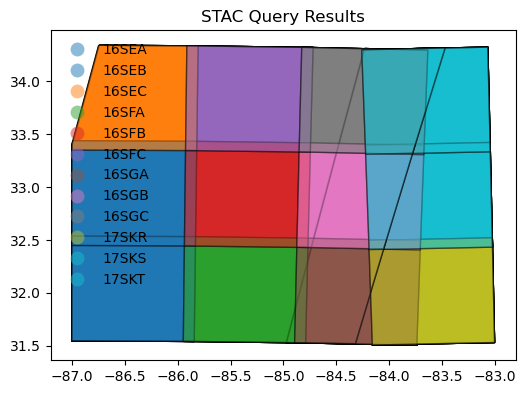

In [11]:
gdf = gpd.GeoDataFrame.from_features(stac_json, "epsg:4326")

# Compute granule id from components
gdf["granule"] = (
    gdf["mgrs:utm_zone"].apply(lambda x: f"{x:02d}")
    + gdf["mgrs:latitude_band"]
    + gdf["mgrs:grid_square"]
)

fig = gdf.plot(
    "granule",
    edgecolor="black",
    categorical=True,
    aspect="equal",
    alpha=0.5,
    figsize=(6, 12),
    legend=True,
    legend_kwds={"loc": "upper left", "frameon": False, "ncol": 1},
)
_ = fig.set_title("STAC Query Results")

In [12]:
def convert_bounds(bbox, invert_y=False):
    """
    Helper method for changing bounding box representation to leaflet notation

    ``(lon1, lat1, lon2, lat2) -> ((lat1, lon1), (lat2, lon2))``
    """
    x1, y1, x2, y2 = bbox
    if invert_y:
        y1, y2 = y2, y1
    return ((y1, x1), (y2, x2))

In [13]:
fig = Figure(width="400px", height="500px")
map1 = folium.Map()
fig.add_child(map1)

folium.GeoJson(
    shapely.geometry.box(*bbox),
    style_function=lambda x: dict(fill=False, weight=1, opacity=0.7, color="olive"),
    name="Query",
).add_to(map1)

gdf.explore(
    "granule",
    categorical=True,
    tooltip=[
        "granule",
        "datetime",
        "s2:nodata_pixel_percentage",
        "eo:cloud_cover",
    ],
    popup=True,
    style_kwds=dict(fillOpacity=0.1, width=2),
    name="STAC",
    m=map1,
)

map1.fit_bounds(bounds=convert_bounds(gdf.unary_union.bounds))
display(fig)

In [14]:
crs = "epsg:3857"
zoom = 2**5

xx = stac_load(
    items,
    bands=("red", "green", "blue"),
    crs=crs,
    resolution=10 * zoom,
    groupby="solar_day",
    stac_cfg=cfg,
)

In [15]:
display(xx)

<xarray.Dataset>
Dimensions:      (y: 1177, x: 1392, time: 24)
Coordinates:
  * y            (y) float64 4.075e+06 4.074e+06 ... 3.699e+06 3.698e+06
  * x            (x) float64 -9.685e+06 -9.685e+06 ... -9.24e+06 -9.24e+06
    spatial_ref  int32 3857
  * time         (time) datetime64[ns] 2023-06-03T16:34:05.235000 ... 2023-07...
Data variables:
    red          (time, y, x) uint16 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0
    green        (time, y, x) uint16 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0
    blue         (time, y, x) uint16 0 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0 0

In [16]:
rgba = to_rgba(xx, clamp=(1, 3000))
_rgba = rgba.compute()


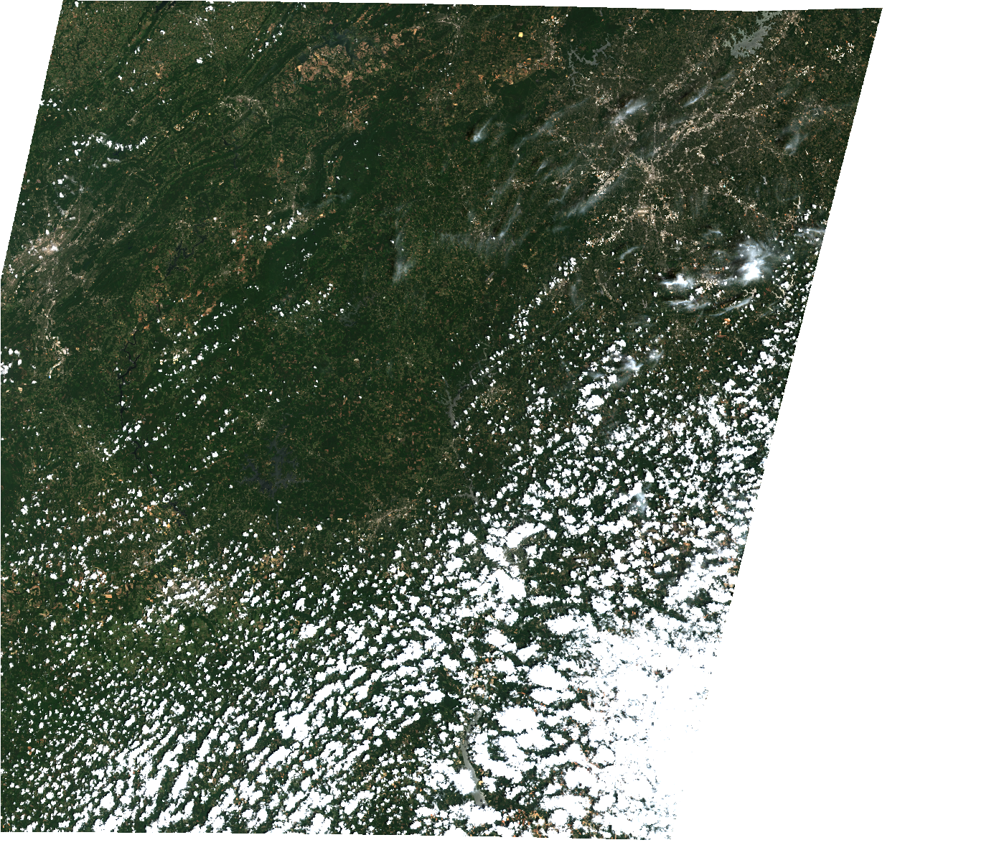

In [17]:
map2 = folium.Map()

folium.GeoJson(
    shapely.geometry.box(*bbox),
    style_function=lambda x: dict(fill=False, weight=1, opacity=0.7, color="olive"),
    name="Query",
).add_to(map2)

gdf.explore(
    "granule",
    categorical=True,
    tooltip=[
        "granule",
        "datetime",
        "s2:nodata_pixel_percentage",
        "eo:cloud_cover",
    ],
    popup=True,
    style_kwds=dict(fillOpacity=0.1, width=2),
    name="STAC",
    m=map2,
)


# Image bounds are specified in Lat/Lon order with Lat axis inversed
image_bounds = convert_bounds(_rgba.geobox.geographic_extent.boundingbox, invert_y=True)
img_ovr = folium.raster_layers.ImageOverlay(
    _rgba.isel(time=0).data, bounds=image_bounds, name="Image"
)
img_ovr.add_to(map2)
map2

folium.LayerControl().add_to(map2)
folium.plugins.Fullscreen().add_to(map2)
map2

In [18]:
r = 6.5 * km2deg
small_bbox = (x - r, y - r, x + r, y + r)

yy = stac_load(
    items,
    bands=("red", "green", "blue", "nir", "swir22"),
    crs=crs,
    resolution=10,
    groupby="solar_day",
    stac_cfg=cfg,
    bbox=small_bbox,
)
im_small = to_rgba(yy, clamp=(1, 3000)).compute()

In [19]:
img_zoomed_in = odc.ui.mk_data_uri(
    odc.ui.to_jpeg_data(im_small.isel(time=0).data, quality=80), "image/jpeg"
)
print(f"Image url: {img_zoomed_in[:64]}...")

Image url: data:image/jpeg;base64,/9j/2wBDAAYEBQYFBAYGBQYHBwYIChAKCgkJChQOD...



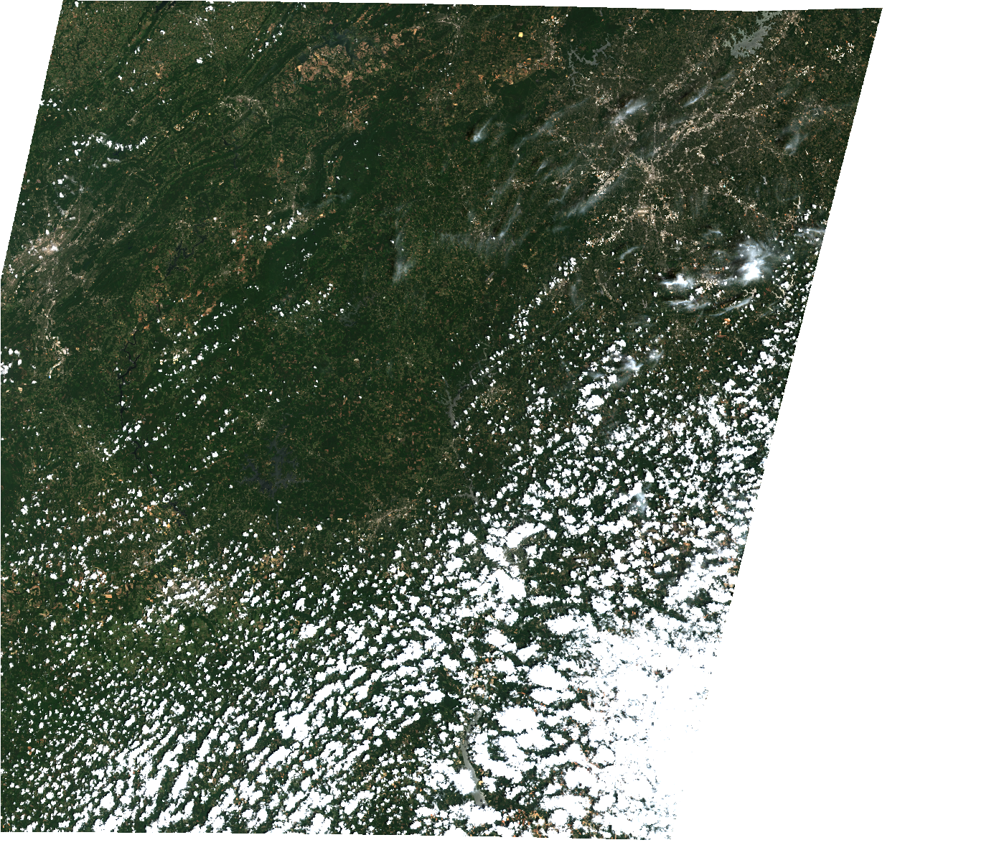

In [20]:
HTML(
    data=f"""
<style> .img-two-column{{
  width: 50%;
  float: left;
}}</style>
<img src="{img_zoomed_in}" alt="Sentinel-2 Zoom in" class="img-two-column">
<img src="{img_ovr.url}" alt="Sentinel-2 Mosaic" class="img-two-column">
"""
)

In [21]:
yy['ndvi'] = (yy['nir'] - yy['red']) / (yy['nir'] + yy['red'])
yy['nbr'] = (yy['nir'] - yy['swir22']) / (yy['nir'] + yy['swir22'])

In [22]:
yy

<xarray.Dataset>
Dimensions:      (y: 1558, x: 1305, time: 24)
Coordinates:
  * y            (y) float64 3.92e+06 3.92e+06 3.92e+06 ... 3.904e+06 3.904e+06
  * x            (x) float64 -9.469e+06 -9.469e+06 ... -9.456e+06 -9.456e+06
    spatial_ref  int32 3857
  * time         (time) datetime64[ns] 2023-06-03T16:34:05.235000 ... 2023-07...
Data variables:
    red          (time, y, x) uint16 1616 1616 1636 1676 1728 1842 ... 0 0 0 0 0
    green        (time, y, x) uint16 1684 1684 1692 1700 1766 1824 ... 0 0 0 0 0
    blue         (time, y, x) uint16 1332 1332 1376 1394 1494 1548 ... 0 0 0 0 0
    nir          (time, y, x) uint16 1268 1268 1280 1351 1425 1419 ... 0 0 0 0 0
    swir22       (time, y, x) uint16 1233 1233 1233 1329 1329 1407 ... 0 0 0 0 0
    ndvi         (time, y, x) float64 22.6 22.6 22.35 21.54 ... nan nan nan nan
    nbr          (time, y, x) float64 0.01399 0.01399 0.0187 ... nan nan nan

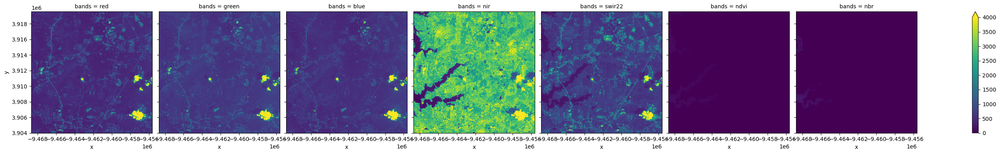

In [53]:
_ = (
    yy.isel(time=22).to_array("bands").plot.imshow(
        col="bands",
        size=4,
        vmin=0,
        vmax=4000
    )
)

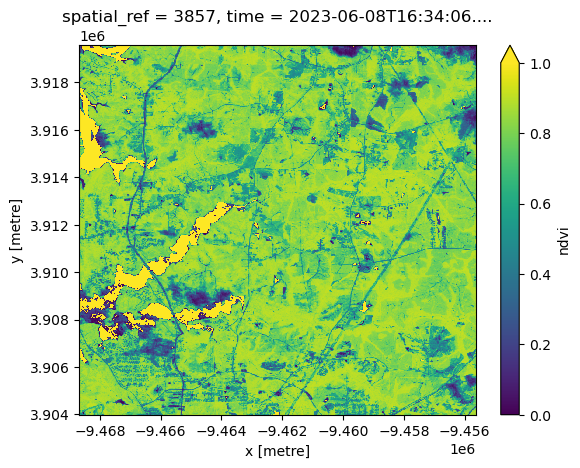

In [39]:
yy['ndvi'].isel(time=2).plot.imshow(vmin=0, vmax=1)

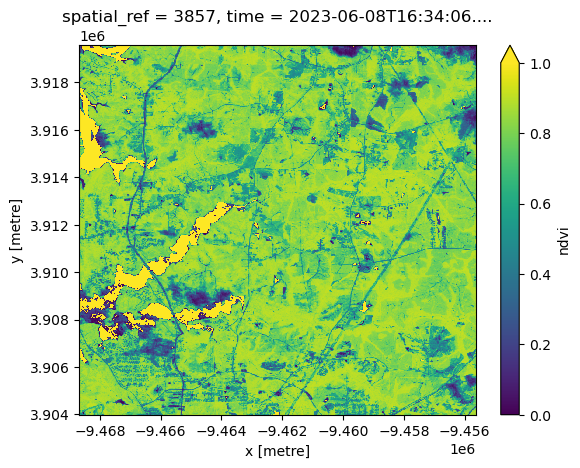

In [55]:
yy['ndvi'].isel(time=2).plot.imshow(vmin=0, vmax=1)

In [56]:
diff_data = (yy['ndvi'].isel(time=22) - yy['ndvi'].isel(time=2))

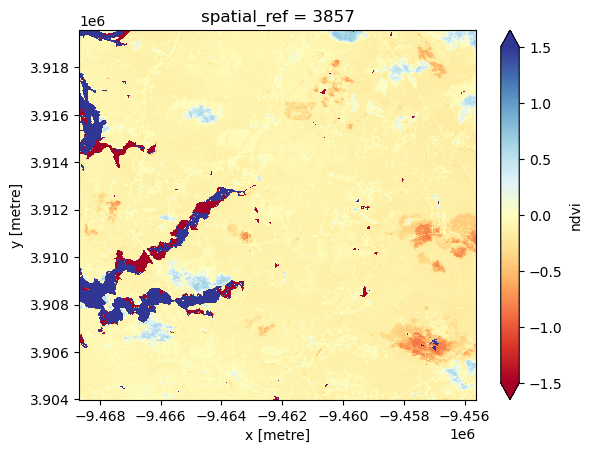

In [57]:
diff_data.plot.imshow(vmin=-1.5, vmax=1.5, cmap="RdYlBu")

In [58]:
nbr_diff_data = (yy['nbr'].isel(time=2) - yy['nbr'].isel(time=22))

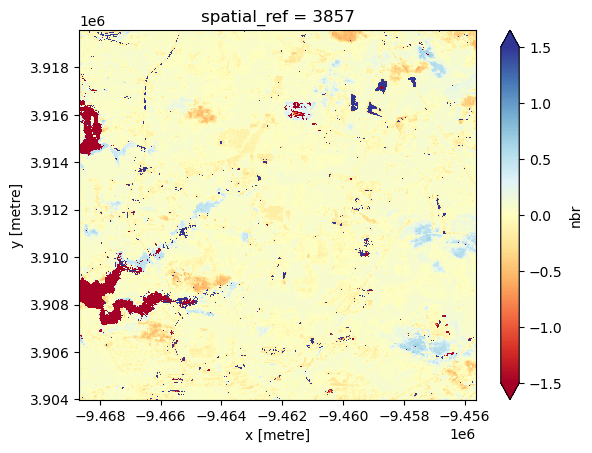

In [59]:
nbr_diff_data.plot.imshow(vmin=-1.5, vmax=1.5, cmap="RdYlBu")

In [60]:
nbr_diff_data.rio.to_raster("nbr_diff_lagrange.tif")

In [85]:
yy.to_netcdf("./data/yy_saved_on_disc.nc")

In [87]:
bily_trial = xr.open_dataset("./data/yy_saved_on_disc.nc")

In [88]:
bily_trial

<xarray.Dataset>
Dimensions:      (y: 1690, x: 1305, time: 25)
Coordinates:
  * y            (y) float64 4.802e+06 4.802e+06 ... 4.785e+06 4.785e+06
  * x            (x) float64 -8.883e+06 -8.883e+06 ... -8.87e+06 -8.87e+06
  * time         (time) datetime64[ns] 2023-06-02T16:12:17.373000 ... 2023-08...
Data variables:
    spatial_ref  int32 ...
    red          (time, y, x) uint16 ...
    green        (time, y, x) uint16 ...
    blue         (time, y, x) uint16 ...
    nir          (time, y, x) uint16 ...
    ndvi         (time, y, x) float64 ...